In [2]:
import os

# 设置当前工作文件夹
os.chdir(r'C:\....\code')
# 读取当前工作文件夹
current_directory = os.getcwd()
print("当前工作文件夹：", current_directory)

当前工作文件夹： C:\bgy\C-documents\碧桂园\集团运营管理工作\专项工作\2023年保交楼\23-12-15\刘磊-监控资金政策分析\code


In [6]:
import pandas as pd
import jieba
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer

# 函数：加载停用词
def load_stopwords(stopwords_file):
    with open(stopwords_file, 'r', encoding='utf-8') as file:
        stopwords = set(line.strip() for line in file.readlines())
    return stopwords

# 函数：使用 jieba 分词并去除停用词
def jieba_tokenize(text, stopwords):
    tokens = jieba.lcut(text)
    filtered_tokens = [token for token in tokens if token not in stopwords and token.isalpha()]
    return ' '.join(filtered_tokens)

# 加载停用词列表
stopwords = load_stopwords(r'D:\python_ex\python_test\NLP-topic_model-main\data\stopwords-master\cn_stopwords.txt')

# 加载自定义词典
jieba.load_userdict(r'path_to_custom_dict.txt')

# 加载数据集
df = pd.read_excel('Policies_text.xlsx')

# 确保 'content' 列不包含额外的换行或空格
df['content'] = df['content'].str.replace('\r\n', ' ', regex=False).str.replace('\n', ' ')

# 应用分词和停用词去除
df['content_cut'] = df['content'].apply(lambda x: jieba_tokenize(x, stopwords))

# 将处理后的文本转换为文档列表
documents = df['content_cut'].tolist()

# 打印列表中的所有文档
for i, doc in enumerate(documents):
    print(f"Document {i+1}: {doc}\n")

# 或者，只打印第一个文档来检查内容
print(documents[0])

Document 1: 万宁市 人民政府办公室 万宁市 商品房 预售资金 监管 实施细则 通知 人民政府 华侨 旅游 经济区 管委会 直属 万宁市 商品房 预售资金 监管 实施细则 已经 次 常务会议 审议 现 组织 实施 万宁市 人民政府办公室 此件 主动公开 万宁市 商品房 预售资金 监管 实施细则 规范 商品房 预售资金 预售资金 监督管理 保障 房地产 房地产 交易 风险 维护 购房人 合法权益 促进 房地产 市场 平稳 健康 发展 切实落实 商品房 预售资金 监管 办法 各项规定 要求 实际 制定 实施细则 本细则 行政区域 批准 预售 商品房 预售资金 收存 支出 监督管理 适用 本细则 万宁市 住房 城乡建设局 商品房 预售资金 监管 主管部门 住建部门 住建部门 委托 资质 第三方 机构 承担 商品房 预售资金 监管 相关 监管 银行 具备 保证 资金监管 规范 运行 金融管理 业务 及能 监管部门 商品房 预售资金 监管 系统 联网 实现 信息 即时 传递 交换 网络 技术 条件 商品房 预售资金 监管 专户 专存 专款专用 全程 监管 节点 控制 多方 监督 确保 商品房 预售资金 用于 商品房 工程建设 预售资金 监管 期限 商品房 预售 许可证 房屋 所有权 首次 登记 解除 资金监管 监管 账户 开立 商品房 预售资金 监管 银行 确定 全市 商品房 预售资金 监管 银行 住建部门 会同 银保监 部门 公开招标 确定 符合 商品房 预售资金 监管 业务 条件 商业银行 列明 具体 承办 商品房 预售资金 监管 业务 支行 名单 建立 监管 银行 库 社会 公示 房地产开发 企业 自行 选择 监管 银行 库 实行 动态 管理 违反 相关 规定 商业银行 不再 保留 监管 银行 库中 房地产开发 企业 申请 办理 商品房 预售 许可证 监管 银行 库 选择 一家 商业银行 商品房 预售许可 申请 对应 一个 账户 开立 监管 账户 开立 监管 账户 申请 房地产开发 企业 材料 住建部门 申请 开立 监管 账户 开户 申请书 开发 企业营业执照 正副 资金 使用 计划书 土地 使用 权证 建设工程 规划 许可证 施工 许可证 测绘 建设 方案 施工进度 表 身份证 提供 材料 审核 住建部门 受理 申请 工作日内 审核 审核 房地产开发 企业 

# 进行词频计算

In [7]:
from collections import Counter

# 计算词频
def get_word_frequencies(documents):
    word_freq = Counter()
    for doc in documents:
        word_freq.update(doc.split())
    return word_freq

# 获取词频
word_frequencies = get_word_frequencies(documents)

# 将词频转换为DataFrame
word_freq_df = pd.DataFrame(word_frequencies.items(), columns=['Word', 'Frequency'])

# 按频率由大到小排列
word_freq_df = word_freq_df.sort_values(by='Frequency', ascending=False)

# 计算词频占比权重
total_words = word_freq_df['Frequency'].sum()
word_freq_df['Weight'] = word_freq_df['Frequency'] / total_words

# 导出到Excel文件
output_file = 'word_frequencies.xlsx'
word_freq_df.to_excel(output_file, index=False)

print(f"词频列表已导出到 {output_file}")


词频列表已导出到 word_frequencies.xlsx


In [8]:
# Initialize the CountVectorizer with your custom tokenizer
vectorizer = CountVectorizer(tokenizer=lambda text: jieba_tokenize(text, stopwords), ngram_range=(2, 4))



In [135]:
from bertopic import BERTopic

# 初始化 BERTopic 模型，调整参数
topic_model = BERTopic(
    vectorizer_model=vectorizer,
    embedding_model="distiluse-base-multilingual-cased-v2",
    n_gram_range=(2, 4),  # 根据需要调整 n-gram 范围
    # specificity=0.05,  # 调整具体性
    top_n_words=20,  # 显示每个主题的关键词数量
    # frost=1.0,  # 调整主题的通用性
    # iterations=1000  # 增加迭代次数
    verbose=True  # 打印日志
)

# 训练模型
topics, probs = topic_model.fit_transform(documents)


# 获取主题信息
topic_model.get_topic_info()

2024-06-10 17:58:43,772 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/2 [00:00<?, ?it/s]

2024-06-10 17:58:51,174 - BERTopic - Embedding - Completed ✓
2024-06-10 17:58:51,174 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-06-10 17:58:56,294 - BERTopic - Dimensionality - Completed ✓
2024-06-10 17:58:56,297 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-06-10 17:58:56,305 - BERTopic - Cluster - Completed ✓
2024-06-10 17:58:56,308 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-06-10 17:58:57,780 - BERTopic - Representation - Completed ✓


,Topic,Count,Name,Representation,Representative_Docs
0,-1,41,-1_ 监_监 管_ 监 管_管,"[ 监, 监 管, 监 管, 管 , 监 管 , 监 管 , 售 , ...",[琼中黎族苗族自治县 住房 城乡 建设局 印发 琼中黎族苗族自治县 商品房 预售 资金 监管...


# LDA继续操作

In [10]:
# # 编号11: 导入LDA和TF-IDF向量化器相关的库
# from sklearn.decomposition import LatentDirichletAllocation
# from sklearn.feature_extraction.text import TfidfVectorizer

# # 编号12: 使用TfidfVectorizer对documents进行向量化
# tfidf_vectorizer = TfidfVectorizer()

# # 将处理好的documents列表转换为TF-IDF矩阵
# tfidf_matrix = tfidf_vectorizer.fit_transform(documents)

# # 编号13: 初始化LDA模型
# lda_model = LatentDirichletAllocation(n_components=25, 
#                                       learning_method='online',
#                                       batch_size=128,evaluate_every=-1, n_jobs=-1,
#                                       random_state=42)

# # 编号14: 训练LDA模型
# lda_model.fit(tfidf_matrix)

# # 编号15: 转换文档到LDA主题空间
# lda_output = lda_model.transform(tfidf_matrix)

# # 编号16: 打印每个主题的前几个关键词
# def print_top_words(model, vectorizer, n_top_words=25):
#     feature_names = vectorizer.get_feature_names_out()
#     for topic_idx, topic in enumerate(model.components_):
#         print("Topic #%d:" % topic_idx)
#         print(" ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]))

# print_top_words(lda_model, tfidf_vectorizer)



import jieba
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import TfidfVectorizer

# 编号11: 导入LDA和TF-IDF向量化器相关的库
# 已经在导入了

# 加载自定义词典
jieba.load_userdict('path_to_custom_dict.txt')

# 编号12: 使用TfidfVectorizer对documents进行向量化
tfidf_vectorizer = TfidfVectorizer(tokenizer=jieba.lcut)  # 使用 jieba 分词

# 将处理好的documents列表转换为TF-IDF矩阵
tfidf_matrix = tfidf_vectorizer.fit_transform(documents)

# 编号13: 初始化LDA模型
lda_model = LatentDirichletAllocation(n_components=25, 
                                      learning_method='online',
                                      batch_size=128, evaluate_every=-1, n_jobs=-1,
                                      random_state=42)

# 编号14: 训练LDA模型
lda_model.fit(tfidf_matrix)

# 编号15: 转换文档到LDA主题空间
lda_output = lda_model.transform(tfidf_matrix)

# 编号16: 打印每个主题的前几个关键词
def print_top_words(model, vectorizer, n_top_words=25):
    feature_names = vectorizer.get_feature_names_out()
    for topic_idx, topic in enumerate(model.components_):
        print("Topic #%d:" % topic_idx)
        print(" ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]))

print_top_words(lda_model, tfidf_vectorizer)


Topic #0:
填补 下次 绿地率 应交 日市 整栋 通知书 名单 未网 法 足够 种 改善服务 说明书 自持 购 清 金融服务 网站 申报材料 省级 退还 周边 公用设施 出现异常
Topic #1:
职能部门 归入 报建 抓 皋兰县 刘梦晓 为 规范化 良性循环 最高 记者 移动 撤案 批表 第一项 出资 抽查 型号 跨行 验收 内设 实务 经常性 均价 放管服
Topic #2:
健全 告知 进一步 浔阳区 第十一届 每平米 邮箱 加 一经查实 红利 付款 分 十一名 利津 一案 冗余 阐明 防止 阅读 维稳 排水工程 违背 会计师 阶段性 层及
Topic #3:
缺失 即甲供 售楼盘 问计 作 南海 系统对 依纪 由县 真实情况 公文 现予 基本相同 守信 七年 全过程 余额 督 销售点 可行 估价师 建立 遵纪守法 怠于 扩大
Topic #4:
包含 隐瞒 超过 征信 从业人员 率高 径向 审定 房子 抽逃 出资 充分 欠款 层高 供应 已经 自发 进账单 自本 方案 应交 应向区 共查 补助款 终端
Topic #5:
乐住 按程序 集资 正本清源 废止 由省 提示信息 本行 每个 依然 机关 已有 含 跃进 信息安全 按新 澎湃 造成 详细 合并 改造费 账务 主营 六章 补交
Topic #6:
七是 报请 采取 将 商业网站 印有 其他费用 许丽 自治县 办 经审 无障碍 第七 基本相同 汇报 特定 九 整改意见 界限 行政区域 百分之一 ip 许可法 扩大 确认
Topic #7:
逃避 发挥 查 中国工商银行 星期六 回避 首都 贯彻落实 人民币 结束 出具 供货商 固定资产 须待 多家 支取 监控 交付 径向 经营性 个人住房 公益性 收益 现予 严
Topic #8:
可售 需持 一个月 两次 沟通 财政预算 构建 传达 书面 中华人民共和国 外连廊 住建 现行 定时 发给 具 必要措施 脚手架 附则 林 第一个 四件 回款 八层 购房
Topic #9:
账目 超过 复苏 开办 长效机制 群体 正当 履行义务 抵押权人 机动 方便 留在 执业资格 评比 县委 上半年 放置 设 证明书 中国 本级 准 竣备 public 试点工作
Topic #10:
非法 使用权 路径 项目前期 缩短 总证 曝光 人为 询问 促销 列支 自持 收

In [11]:
# 导入所需库
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
import pandas as pd




# 转换文档到LDA主题空间
lda_output = lda_model.transform(tfidf_matrix)

# 获取每个关键词的频率
def get_term_frequencies(vectorizer, tfidf_matrix):
    feature_names = vectorizer.get_feature_names_out()
    total_counts = np.array(tfidf_matrix.sum(axis=0)).flatten()
    term_frequencies = dict(zip(feature_names, total_counts))
    return term_frequencies

# 获取词频字典
term_frequencies = get_term_frequencies(tfidf_vectorizer, tfidf_matrix)

# 打印每个主题的前几个关键词并创建表格
def create_topic_table(model, vectorizer, n_top_words=25):
    feature_names = vectorizer.get_feature_names_out()
    topics_data = []
    
    for topic_idx, topic in enumerate(model.components_):
        topic_keywords = [feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]
        topic_frequencies = [term_frequencies[term] for term in topic_keywords]
        
        topics_data.append([' '.join(topic_keywords)])
        topics_data.append([' '.join(map(str, topic_frequencies))])
    
    return pd.DataFrame(topics_data, columns=['Topic Data'])

# 创建主题表格
topic_table = create_topic_table(lda_model, tfidf_vectorizer)

# 将主题表格保存为 Excel 文件
topic_table.to_excel("topic_table.xlsx", index=False)

# 打印主题表格
topic_table



,Topic Data
0,填补 下次 绿地率 应交 日市 整栋 通知书 名单 未网 法 足够 种 改善服务 说明书 自...
1,0.001830286628107209 0.0016821514734712208 0.0...
2,职能部门 归入 报建 抓 皋兰县 刘梦晓 为 规范化 良性循环 最高 记者 移动 撤案 批表...
3,0.004186097921332983 0.0015976598360552643 0.0...
4,健全 告知 进一步 浔阳区 第十一届 每平米 邮箱 加 一经查实 红利 付款 分 十一名 利...
5,0.00747473445801506 0.04833231155002021 0.0544...
6,缺失 即甲供 售楼盘 问计 作 南海 系统对 依纪 由县 真实情况 公文 现予 基本相同 守...
7,0.004820084036043044 0.001830286628107209 0.00...
8,包含 隐瞒 超过 征信 从业人员 率高 径向 审定 房子 抽逃 出资 充分 欠款 层高 供应...
9,0.010612233426626086 0.012326546084972193 0.07...


# BERTopic

In [10]:
# Initialize the CountVectorizer with your custom tokenizer
vectorizer = CountVectorizer(tokenizer=lambda text: jieba_tokenize(text, stopwords), ngram_range=(2, 4))
from bertopic import BERTopic

# Initialize BERTopic
topic_model = BERTopic(
    vectorizer_model=vectorizer,
    embedding_model="distiluse-base-multilingual-cased-v2",
    n_gram_range=(2, 4),  # Adjust n-gram range as needed
    # specificity=0.05,  # Adjust specificity
    top_n_words=20,  # Show top n words for each topic
    # frost=1.0,  # Adjust topic generality
    # iterations=1000  # Increase number of iterations
    verbose=True  # Print logs
)

# Fit the model
topics, probs = topic_model.fit_transform(documents)
topic_model.get_topic_info()

2024-06-11 00:04:10,294 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/2 [00:00<?, ?it/s]

2024-06-11 00:04:15,073 - BERTopic - Embedding - Completed ✓
2024-06-11 00:04:15,074 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-06-11 00:04:16,380 - BERTopic - Dimensionality - Completed ✓
2024-06-11 00:04:16,380 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-06-11 00:04:16,384 - BERTopic - Cluster - Completed ✓
2024-06-11 00:04:16,385 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-06-11 00:04:17,756 - BERTopic - Representation - Completed ✓


,Topic,Count,Name,Representation,Representative_Docs
0,-1,41,-1_ 监_监 管_ 监 管_ 预,"[ 监, 监 管, 监 管, 预, 管 , 监 管 , 预 售, 预 售,...",[琼中黎族苗族自治县 住房 城乡建设局 琼中黎族苗族自治县 商品房 预售资金 监管 实施 通...


In [25]:
# 获取所有主题，包括主题 -1
all_topics = topic_model.get_topic_info().Topic.values

# 可视化主题间的相似性
topic_model.visualize_topics(topics=all_topics)
# fig.show()

# # 可视化每个文档的主题分布
# topic_model.visualize_distribution(probs[0])
# fig.show()

# # 可视化主题中的关键词
# topic_model.visualize_barchart()
# fig.show()

# # 可视化主题层次结构
# topic_model.visualize_hierarchy()
# fig.show()

# # 可视化主题演变
# df['year'] = pd.to_datetime(df['year'])
# timestamps = df['year'].tolist()
# fig = topic_model.visualize_topics_over_time(timestamps)
# fig.show()



ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'customdata': array([[-1, '  监 | 监 管 |   监 管 |   预 | 管  ', 41]], dtype=object),
              'hovertemplate': '<b>Topic %{customdata[0]}</b><br>%{customdata[1]}<br>Size: %{customdata[2]}',
              'legendgroup': '',
              'marker': {'color': '#B0BEC5',
                         'line': {'color': 'DarkSlateGrey', 'width': 2},
                         'size': array([41], dtype=int64),
                         'sizemode': 'area',
                         'sizeref': 0.025625,
                         'symbol': 'circle'},
              'mode': 'markers',
              'name': '',
              'orientation': 'v',
              'showlegend': False,
              'type': 'scatter',
              'x': array([0.]),
              'xaxis': 'x',
              'y': array([0.]),
              'yaxis': 'y'}],
    'layout': {'annotations': [{'showarrow': False, 'text': 'D1', 'x': 0.0, 'y': 0.0, 'yshift': 10},
                               {'showarrow': False, 'text': 'D2', 'x': 0.0, 'xshift': 10, 'y': 0.0}],
               'height': 650,
               'hoverlabel': {'bgcolor': 'white', 'font': {'family': 'Rockwell', 'size': 16}},
               'legend': {'itemsizing': 'constant', 'tracegroupgap': 0},
               'margin': {'t': 60},
               'shapes': [{'line': {'color': '#CFD8DC', 'width': 2},
                           'type': 'line',
                           'x0': 0.0,
                           'x1': 0.0,
                           'y0': 0.0,
                           'y1': 0.0},
                          {'line': {'color': '#9E9E9E', 'width': 2},
                           'type': 'line',
                           'x0': 0.0,
                           'x1': 0.0,
                           'y0': 0.0,
                           'y1': 0.0}],
               'sliders': [{'active': 0,
                            'pad': {'t': 50},
                            'steps': [{'args': [{'marker.color': [['#B0BEC5']]}],
                                       'label': 'Topic -1',
                                       'method': 'update'}]}],
               'template': '...',
               'title': {'font': {'color': 'Black', 'size': 22},
                         'text': '<b>Intertopic Distance Map</b>',
                         'x': 0.5,
                         'xanchor': 'center',
                         'y': 0.95,
                         'yanchor': 'top'},
               'width': 650,
               'xaxis': {'anchor': 'y',
                         'domain': [0.0, 1.0],
                         'range': [0.0, 0.0],
                         'title': {'text': ''},
                         'visible': False},
               'yaxis': {'anchor': 'x',
                         'domain': [0.0, 1.0],
                         'range': [0.0, 0.0],
                         'title': {'text': ''},
                         'visible': False}}
})

# 由于自动化建模不理想故切换回LDA

In [12]:
import os
# 设置当前工作目录
os.chdir(r'C:\...\code')

# 读取当前工作目录
current_directory = os.getcwd()
print("当前工作文件夹：", current_directory)

当前工作文件夹： C:\bgy\C-documents\碧桂园\集团运营管理工作\专项工作\2023年保交楼\23-12-15\刘磊-监控资金政策分析\code


c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 19979 (\N{CJK UNIFIED IDEOGRAPH-4E0B}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 21015 (\N{CJK UNIFIED IDEOGRAPH-5217}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 34892 (\N{CJK UNIFIED IDEOGRAPH-884C}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 20026 (\N{CJK UNIFIED IDEOGRAPH-4E3A}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 19987 (\N{CJK UNIFIED IDEOGRAPH-4E13}) missing f

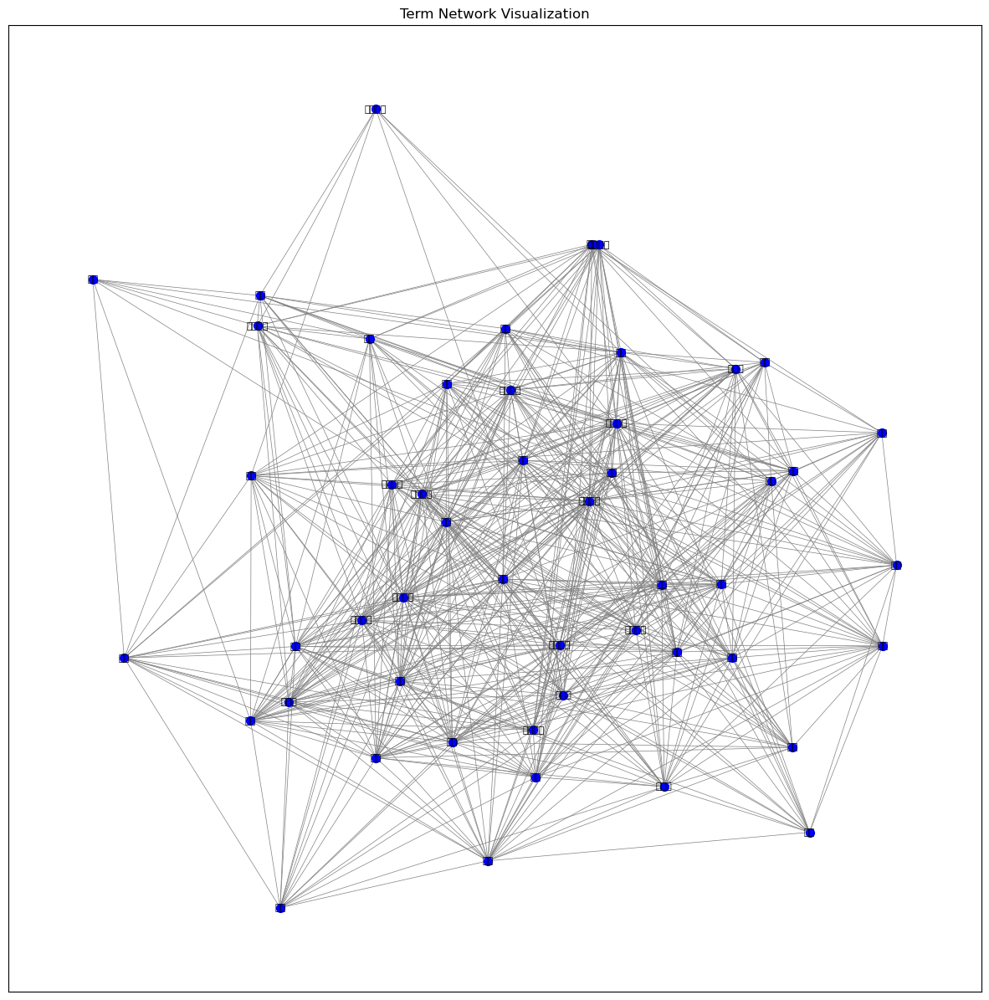

In [13]:
import pandas as pd
import jieba
from sklearn.feature_extraction.text import CountVectorizer
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt





# 创建文档-术语矩阵
vectorizer = CountVectorizer()
dtm_matrix = vectorizer.fit_transform(df['content_cut']).toarray()
terms = vectorizer.get_feature_names_out()

# 计算每个术语在文档中的出现频率
term_freq = dtm_matrix.sum(axis=0)

# 只保留在至少30个文档中出现的术语，并且不超过90%的文档
min_freq = 30
max_freq = 0.9 * dtm_matrix.shape[0]
valid_terms_mask = (term_freq >= min_freq) & (term_freq <= max_freq)
dtm_matrix = dtm_matrix[:, valid_terms_mask]
terms = terms[valid_terms_mask]

# 创建共现矩阵
term_matrix = dtm_matrix.T @ dtm_matrix

# 去除权重较低的边
term_matrix[term_matrix < 30] = 0
np.fill_diagonal(term_matrix, 0)  # 设置对角线为0

# 创建网络对象
G = nx.from_numpy_array(term_matrix)
mapping = {i: term for i, term in enumerate(terms)}
G = nx.relabel_nodes(G, mapping)

# 去除孤立节点
G.remove_nodes_from(list(nx.isolates(G)))

# 使用networkx进行可视化
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G, k=0.1)
nx.draw_networkx_nodes(G, pos, node_size=50, node_color='blue')
nx.draw_networkx_edges(G, pos, width=0.5, edge_color='grey')
nx.draw_networkx_labels(G, pos, font_size=8, font_color='black')
plt.title("Term Network Visualization")
plt.show()


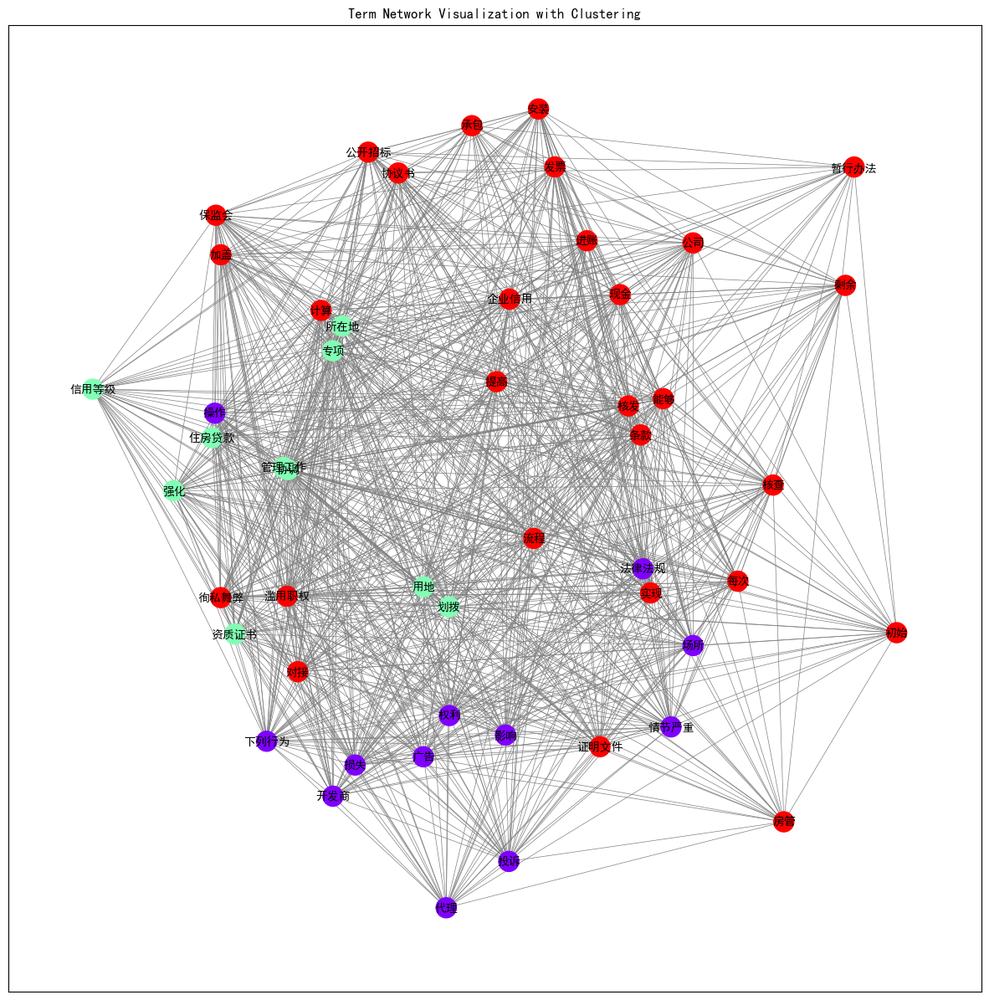

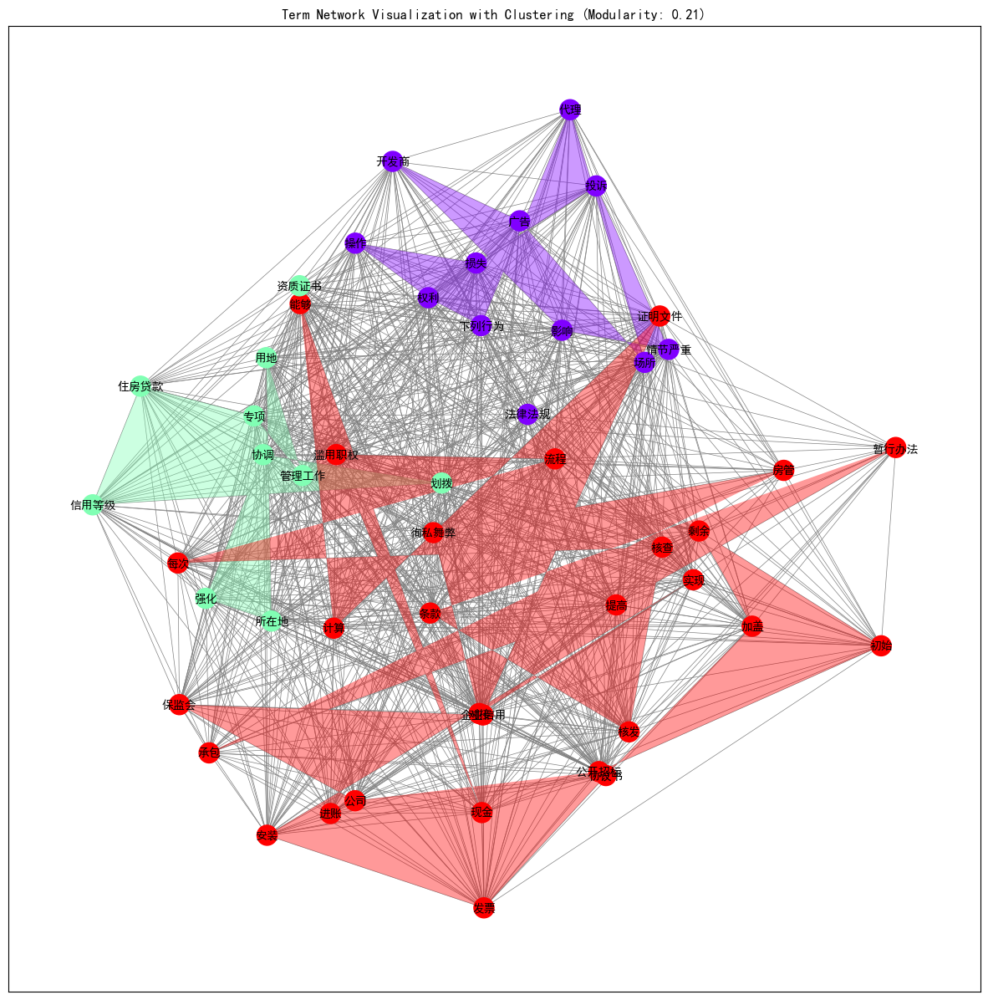

In [207]:

import pandas as pd
import jieba
from sklearn.feature_extraction.text import CountVectorizer
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from community import community_louvain
import platform
from matplotlib.font_manager import FontProperties
from matplotlib.patches import Polygon
from matplotlib.patches import PathPatch
from matplotlib.path import Path

# Set font based on the operating system
system = platform.system()
if system == 'Windows':
    font_path = 'C:/Windows/Fonts/simhei.ttf'  # Adjust the path as needed
elif system == 'Darwin':
    font_path = '/Library/Fonts/Arial Unicode.ttf'  # Adjust the path as needed
else:
    font_path = '/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf'  # Adjust the path as needed

# 设置字体属性
font_prop = FontProperties(fname=font_path)





# 计算每个术语在文档中的出现频率
term_freq = dtm_matrix.sum(axis=0)

# 只保留在至少30个文档中出现的术语，并且不超过90%的文档
min_freq = 5
max_freq = 1 * dtm_matrix.shape[0]
valid_terms_mask = (term_freq >= min_freq) & (term_freq <= max_freq)
dtm_matrix = dtm_matrix[:, valid_terms_mask]
terms = terms[valid_terms_mask]

# 创建共现矩阵
term_matrix = dtm_matrix.T @ dtm_matrix

# 去除权重较低的边
term_matrix[term_matrix < 20] = 0
np.fill_diagonal(term_matrix, 0)  # 设置对角线为0

# 创建网络对象
G = nx.from_numpy_array(term_matrix)
mapping = {i: term for i, term in enumerate(terms)}
G = nx.relabel_nodes(G, mapping)

# 去除孤立节点
G.remove_nodes_from(list(nx.isolates(G)))

# 进行社区检测
partition = community_louvain.best_partition(G)

# 设置节点颜色
colors = [partition[node] for node in G.nodes()]

# 设置全局字体
plt.rcParams['font.sans-serif'] = [font_prop.get_name()]
plt.rcParams['axes.unicode_minus'] = False

# 使用networkx进行可视化
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G, k=0.1)
nx.draw_networkx_nodes(G, pos, node_size=300, node_color=colors, cmap=plt.cm.rainbow, node_shape='o')  # 节点变成圆形
nx.draw_networkx_edges(G, pos, width=0.5, edge_color='grey')
nx.draw_networkx_labels(G, pos, font_size=10, font_color='black')
plt.title("Term Network Visualization with Clustering")
plt.show()

# ...您已有的代码...

# 进行社区检测
partition = community_louvain.best_partition(G)

# 使用networkx进行可视化
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G, k=0.1)

# 绘制节点
nx.draw_networkx_nodes(G, pos, node_size=300, node_color=colors, cmap=plt.cm.rainbow, node_shape='o')

# 绘制边
nx.draw_networkx_edges(G, pos, width=0.5, edge_color='grey')

# 绘制节点标签
nx.draw_networkx_labels(G, pos, font_size=10, font_color='black')

# 绘制社区的弧形色块
for com in set(partition.values()):
    nodes_in_com = [node for node in G.nodes() if partition[node] == com]
    node_positions = np.array([pos[node] for node in nodes_in_com])
    # 将节点位置转换为PathPatch所需的坐标点
    points = node_positions.tolist()
    # 创建Path对象，代码点定义为一个封闭的多边形
    path = Path(points, closed=True)
    
    # 创建PathPatch对象
    patch = PathPatch(path, edgecolor='none', facecolor=plt.cm.rainbow(com / max(partition.values())), alpha=0.4)
    plt.gca().add_patch(patch)

# 显示模块化值
plt.title("Term Network Visualization with Clustering (Modularity: {:.2f})".format(modularity))

# 显示图表
plt.show()


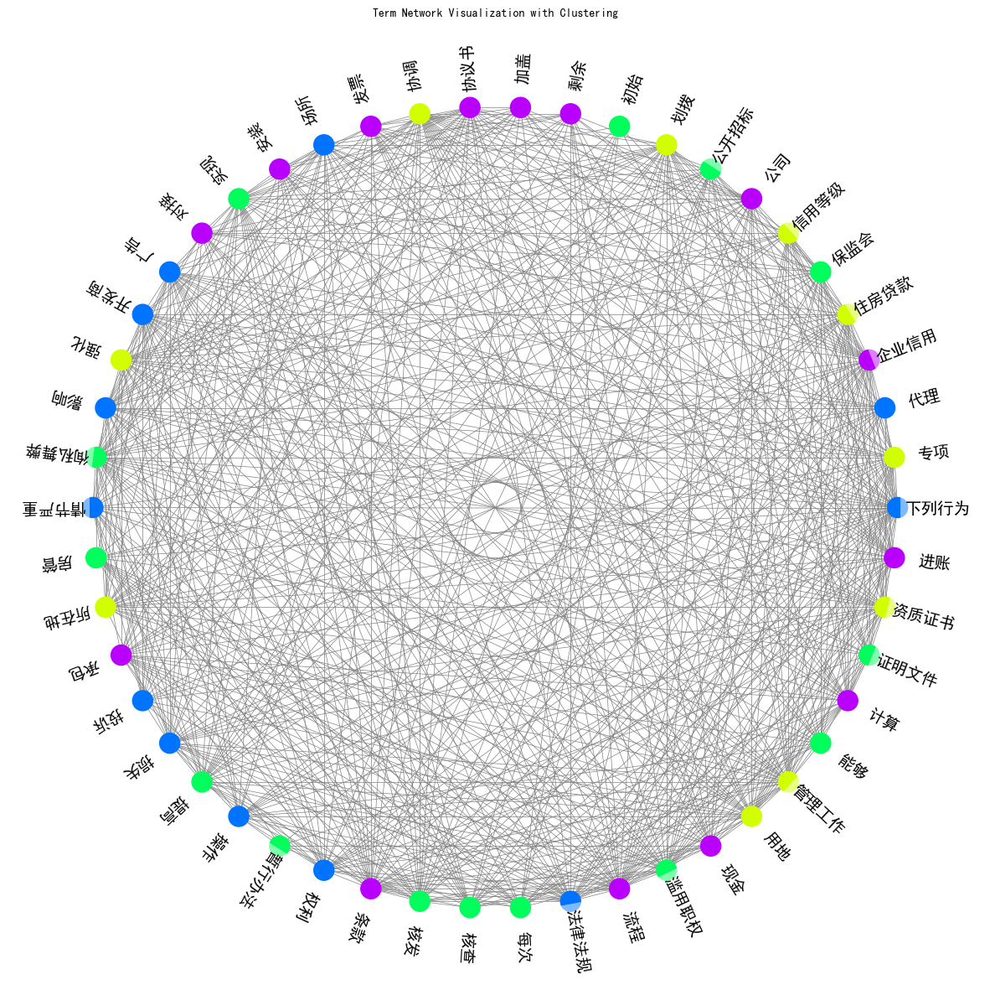

In [174]:

import pandas as pd
import jieba
from sklearn.feature_extraction.text import CountVectorizer
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from community import community_louvain
import platform
from matplotlib.font_manager import FontProperties
import seaborn as sns

# Set font based on the operating system
system = platform.system()
if system == 'Windows':
    font_path = 'C:/Windows/Fonts/simhei.ttf'  # Adjust the path as needed
elif system == 'Darwin':
    font_path = '/Library/Fonts/Arial Unicode.ttf'  # Adjust the path as needed
else:
    font_path = '/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf'  # Adjust the path as needed

# 设置字体属性
font_prop = FontProperties(fname=font_path)





# 计算每个术语在文档中的出现频率
term_freq = dtm_matrix.sum(axis=0)

# 只保留在至少30个文档中出现的术语，并且不超过90%的文档
min_freq = 10
max_freq = 0.95 * dtm_matrix.shape[0]
valid_terms_mask = (term_freq >= min_freq) & (term_freq <= max_freq)
dtm_matrix = dtm_matrix[:, valid_terms_mask]
terms = terms[valid_terms_mask]

# 创建共现矩阵
term_matrix = dtm_matrix.T @ dtm_matrix

# 去除权重较低的边
term_matrix[term_matrix < 30] = 0
np.fill_diagonal(term_matrix, 0)  # 设置对角线为0

# 创建网络对象
G = nx.from_numpy_array(term_matrix)
mapping = {i: term for i, term in enumerate(terms)}
G = nx.relabel_nodes(G, mapping)

# 去除孤立节点
G.remove_nodes_from(list(nx.isolates(G)))

# 进行社区检测
partition = community_louvain.best_partition(G)

# 设置节点颜色
num_clusters = len(set(partition.values()))
palette = sns.color_palette("hsv", num_clusters)
colors = [palette[partition[node]] for node in G.nodes()]

# 设置全局字体
plt.rcParams['font.sans-serif'] = [font_prop.get_name()]
plt.rcParams['axes.unicode_minus'] = False

# # 生成极坐标布局
# def circular_layout(graph,scale=10):
#     """Generate a circular layout for the graph"""
#     pos = nx.spring_layout(graph, k=0.1)
#     max_radius = max(np.linalg.norm(list(pos.values()), axis=1))
#     circular_pos = {}
#     for i, (node, (x, y)) in enumerate(pos.items()):
#         angle = 2 * np.pi * i / len(graph.nodes)
#         circular_pos[node] = (np.cos(angle) * max_radius, np.sin(angle) * max_radius)
#     return circular_pos

# pos = circular_layout(G, scale=10)

# 生成极坐标布局
def circular_layout(graph, scale=2):
    """Generate a circular layout for the graph with scaled radius"""
    num_nodes = len(graph.nodes)
    circular_pos = {}
    for i, node in enumerate(graph.nodes):
        angle = 2 * np.pi * i / num_nodes
        x = scale * np.cos(angle)
        y = scale * np.sin(angle)
        circular_pos[node] = (x, y)
    return circular_pos

pos = circular_layout(G, scale=2.0)


# 使用networkx进行可视化
plt.figure(figsize=(15, 15))

# 绘制节点
nx.draw_networkx_nodes(G, pos, node_size=300, node_color=colors, cmap=plt.cm.hsv, node_shape='o')  # 节点变成圆形

# 绘制边
nx.draw_networkx_edges(G, pos, width=0.5, edge_color='grey')

# 绘制标签，文字向外侧偏移
for node, (x, y) in pos.items():
    angle = np.arctan2(y, x)
    plt.text(x * 1.1, y * 1.1, node, fontsize=14, fontproperties=font_prop, ha='center', va='center',
             bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'),
             rotation=np.degrees(angle), rotation_mode='anchor')

plt.title("Term Network Visualization with Clustering", fontproperties=font_prop)
plt.axis('off')
plt.show()


In [165]:
# 导出关键词
keywords_df = pd.DataFrame(terms, columns=['Keyword'])
keywords_df.to_excel('keywords.xlsx', index=False)

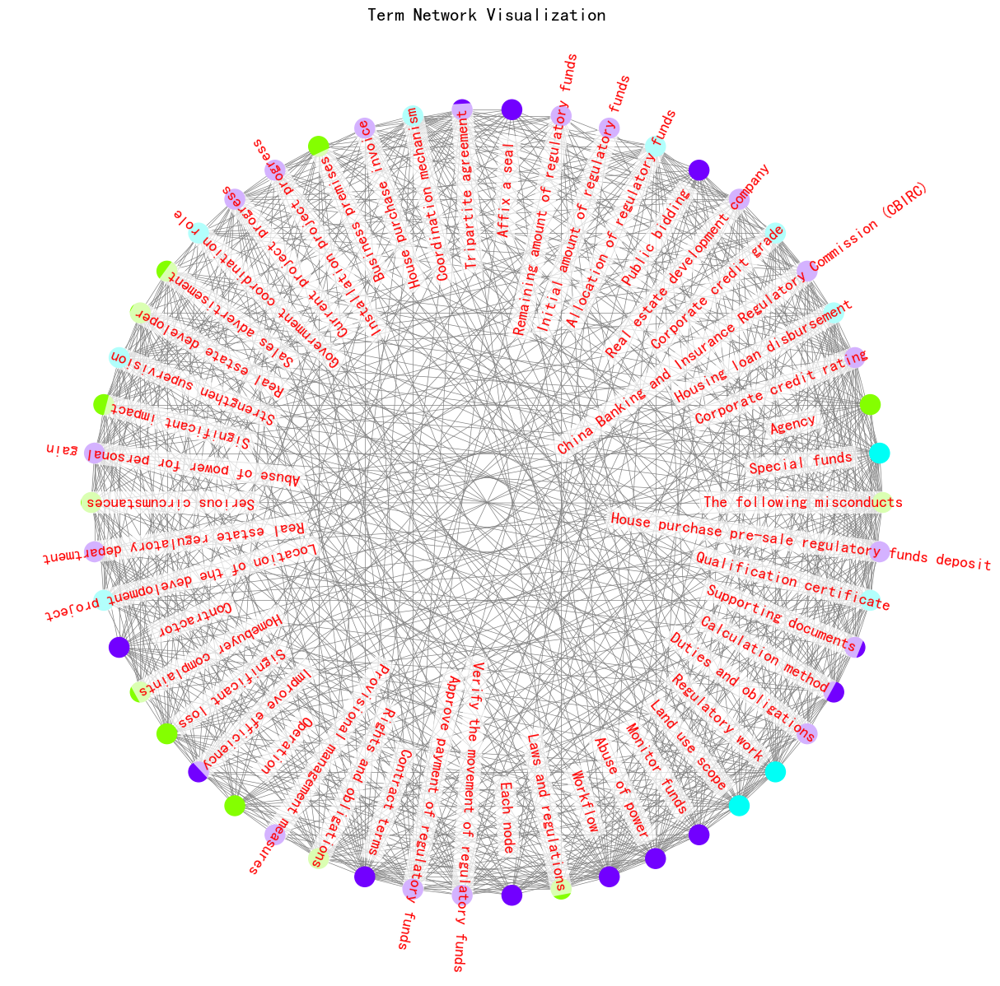

In [166]:
# 读取翻译后的关键词（假设文件名为translated_keywords.xlsx）
translated_keywords_df = pd.read_excel('translated_keywords.xlsx')
translated_keywords = translated_keywords_df.set_index('Keyword')['Translation'].to_dict()

# 替换关键词为翻译后的词
translated_terms = [translated_keywords.get(term, term) for term in terms]

# 重新创建文档-术语矩阵，保持一致性
valid_terms_mask = np.array([term in translated_keywords for term in terms])
dtm_matrix = dtm_matrix[:, valid_terms_mask]
terms = np.array(translated_terms)[valid_terms_mask]

# 创建共现矩阵
term_matrix = dtm_matrix.T @ dtm_matrix

# 去除权重较低的边
term_matrix[term_matrix < 30] = 0
np.fill_diagonal(term_matrix, 0)  # 设置对角线为0

# 创建网络对象
G = nx.from_numpy_array(term_matrix)
mapping = {i: term for i, term in enumerate(terms)}
G = nx.relabel_nodes(G, mapping)

# 去除孤立节点
G.remove_nodes_from(list(nx.isolates(G)))

# 进行社区检测
partition = community_louvain.best_partition(G)

# 设置节点颜色
num_clusters = len(set(partition.values()))
palette = sns.color_palette("hsv", num_clusters)
colors = [palette[partition[node]] for node in G.nodes()]

# 设置全局字体
plt.rcParams['font.sans-serif'] = [font_prop.get_name()]
plt.rcParams['axes.unicode_minus'] = False

# 生成极坐标布局
def circular_layout(graph, scale=2):
    """Generate a circular layout for the graph with scaled radius"""
    num_nodes = len(graph.nodes)
    circular_pos = {}
    for i, node in enumerate(graph.nodes):
        angle = 2 * np.pi * i / num_nodes
        x = scale * np.cos(angle)
        y = scale * np.sin(angle)
        circular_pos[node] = (x, y)
    return circular_pos

pos = circular_layout(G, scale=2.0)


# 使用networkx进行可视化
plt.figure(figsize=(15, 15))

# 绘制节点
nx.draw_networkx_nodes(G, pos, node_size=300, node_color=colors, cmap=plt.cm.hsv, node_shape='o')  # 节点变成圆形

# 绘制边
nx.draw_networkx_edges(G, pos, width=0.5, edge_color='grey')

# 绘制标签，文字向外侧偏移
for node, (x, y) in pos.items():
    angle = np.arctan2(y, x)
    plt.text(x * 0.8, y * 0.8, node, fontsize=14, fontproperties=font_prop, ha='center', va='center',
             color='red', bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'),
             rotation=np.degrees(angle), rotation_mode='anchor')

plt.title("Term Network Visualization", fontproperties=font_prop, fontsize=16, loc='center')

plt.axis('off')
plt.show()


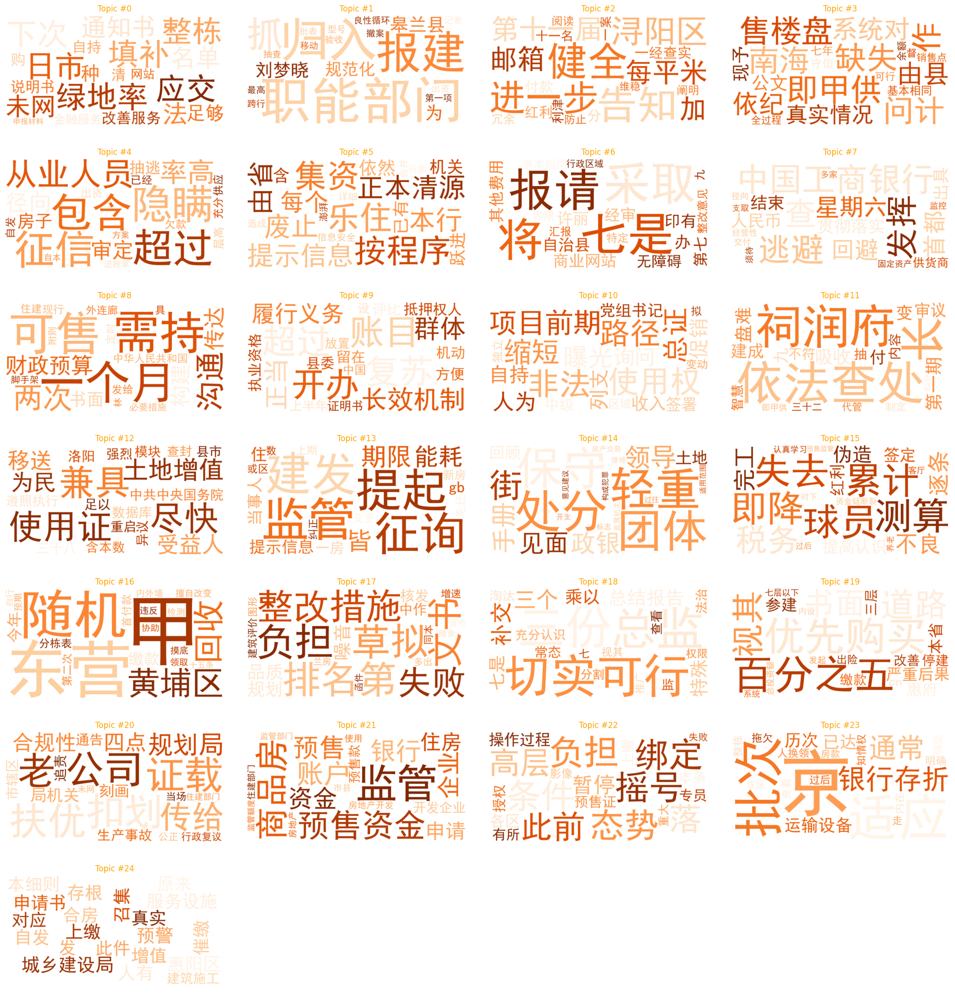

C:\Users\Eric\AppData\Local\Temp\ipykernel_3696\970302516.py:66: UserWarning: Glyph 22635 (\N{CJK UNIFIED IDEOGRAPH-586B}) missing from font(s) DejaVu Sans.
  plt.tight_layout(pad=0.5)
C:\Users\Eric\AppData\Local\Temp\ipykernel_3696\970302516.py:66: UserWarning: Glyph 34917 (\N{CJK UNIFIED IDEOGRAPH-8865}) missing from font(s) DejaVu Sans.
  plt.tight_layout(pad=0.5)
C:\Users\Eric\AppData\Local\Temp\ipykernel_3696\970302516.py:66: UserWarning: Glyph 19979 (\N{CJK UNIFIED IDEOGRAPH-4E0B}) missing from font(s) DejaVu Sans.
  plt.tight_layout(pad=0.5)
C:\Users\Eric\AppData\Local\Temp\ipykernel_3696\970302516.py:66: UserWarning: Glyph 27425 (\N{CJK UNIFIED IDEOGRAPH-6B21}) missing from font(s) DejaVu Sans.
  plt.tight_layout(pad=0.5)
C:\Users\Eric\AppData\Local\Temp\ipykernel_3696\970302516.py:66: UserWarning: Glyph 32511 (\N{CJK UNIFIED IDEOGRAPH-7EFF}) missing from font(s) DejaVu Sans.
  plt.tight_layout(pad=0.5)
C:\Users\Eric\AppData\Local\Temp\ipykernel_3696\970302516.py:66: UserWarnin

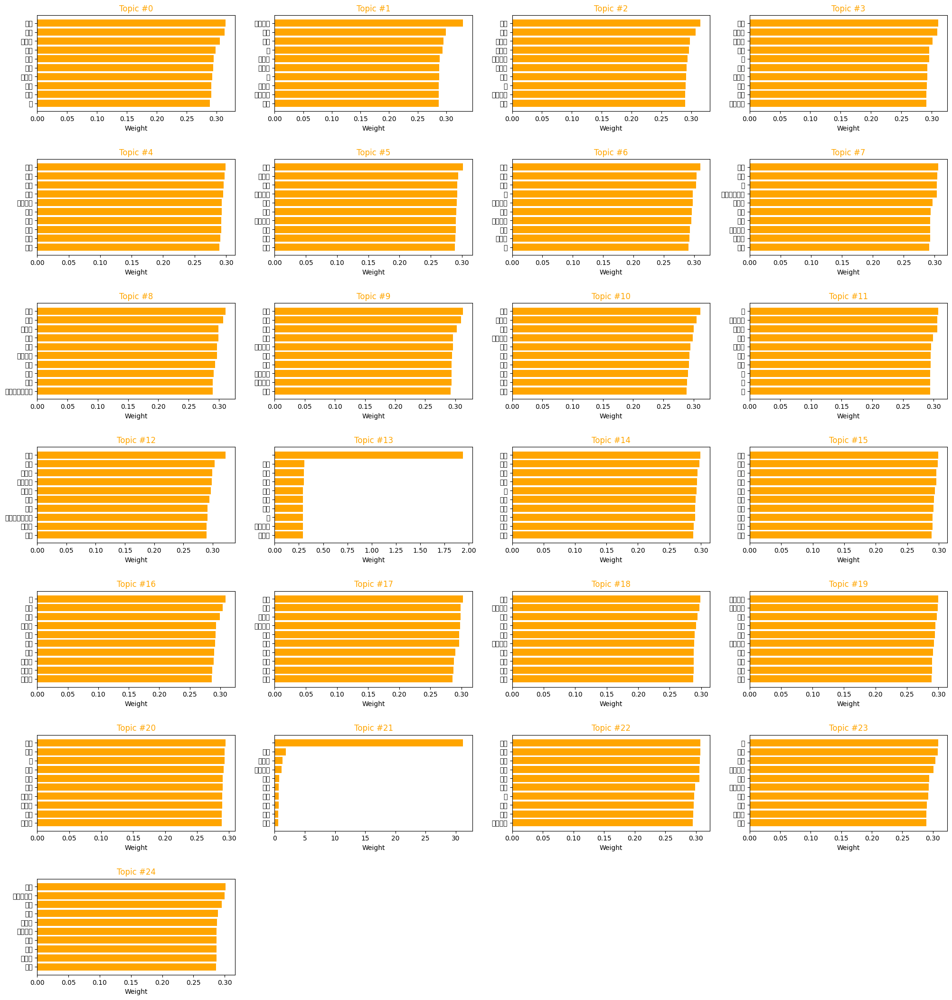

In [23]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import platform

# Set font based on the operating system
system = platform.system()
if system == 'Windows':
    font_path = 'C:/Windows/Fonts/simhei.ttf'  # Adjust the path as needed
elif system == 'Darwin':
    font_path = '/Library/Fonts/Arial Unicode.ttf'  # Adjust the path as needed
else:
    font_path = '/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf'  # Adjust the path as needed

# Function to plot word clouds in a grid
def plot_word_clouds_grid(lda_model, vectorizer, n_top_words=20, cols=4):
    feature_names = vectorizer.get_feature_names_out()
    n_topics = lda_model.n_components
    rows = (n_topics + cols - 1) // cols  # Calculate the number of rows needed
    
    fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3))
    axes = axes.flatten()  # Flatten the 2D array of axes
    
    for topic_idx, topic in enumerate(lda_model.components_):
        word_freq = {feature_names[i]: topic[i] for i in topic.argsort()[:-n_top_words - 1:-1]}
        
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='Oranges', font_path=font_path).generate_from_frequencies(word_freq)
        
        ax = axes[topic_idx]
        ax.imshow(wordcloud, interpolation='bilinear')
        ax.axis("off")
        ax.set_title(f"Topic #{topic_idx}", color='orange')
    
    # Hide any unused subplots
    for i in range(topic_idx + 1, len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout(pad=0.5)  # Reduce padding between subplots
    plt.subplots_adjust(wspace=0.1, hspace=0.1)  # Adjust space between subplots
    plt.show()


# Function to plot top words bar chart in a grid
def plot_top_words_grid(lda_model, vectorizer, n_top_words=10, cols=4):
    feature_names = vectorizer.get_feature_names_out()
    n_topics = lda_model.n_components
    rows = (n_topics + cols - 1) // cols  # Calculate the number of rows needed
    
    fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3))
    axes = axes.flatten()  # Flatten the 2D array of axes
    
    for topic_idx, topic in enumerate(lda_model.components_):
        top_features_indices = topic.argsort()[:-n_top_words - 1:-1]
        top_features = [feature_names[i] for i in top_features_indices]
        top_weights = topic[top_features_indices]
        
        ax = axes[topic_idx]
        ax.barh(top_features, top_weights, align='center', color='orange')
        ax.set_title(f'Topic #{topic_idx}', color='orange')
        ax.invert_yaxis()
        ax.set_xlabel('Weight')
    
    # Hide any unused subplots
    for i in range(topic_idx + 1, len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout(pad=0.5)
    plt.subplots_adjust(wspace=0.2, hspace=0.5)  # 调整子图之间的间距
    plt.show()

# Plot word clouds in a grid
plot_word_clouds_grid(lda_model, tfidf_vectorizer)

# Plot top words bar charts in a grid
plot_top_words_grid(lda_model, tfidf_vectorizer)





In [209]:
# Log Likelyhood: Higher the better
print("Log Likelihood: ", lda_model.score(tfidf_matrix))

# Perplexity: Lower the better. Perplexity = exp(-1. * log-likelihood per word)
print("Perplexity: ", lda_model.perplexity(tfidf_matrix))

# See model parameters
print(lda_model.get_params())

Log Likelihood:  -104762.55378494438
Perplexity:  inf
{'batch_size': 128, 'doc_topic_prior': None, 'evaluate_every': -1, 'learning_decay': 0.7, 'learning_method': 'online', 'learning_offset': 10.0, 'max_doc_update_iter': 100, 'max_iter': 10, 'mean_change_tol': 0.001, 'n_components': 25, 'n_jobs': -1, 'perp_tol': 0.1, 'random_state': 42, 'topic_word_prior': None, 'total_samples': 1000000.0, 'verbose': 0}


C:\Users\Eric\AppData\Roaming\Python\Python39\site-packages\sklearn\decomposition\_lda.py:895: RuntimeWarning: overflow encountered in exp
  return np.exp(-1.0 * perword_bound)


In [16]:
# 编号11: 导入必要的库
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.model_selection import GridSearchCV
# from sklearn.feature_extraction.text import TfidfVectorizer

# 编号12: 假设documents是一个经过预处理的文本列表
# 如果documents是原始文本数据，我们需要先使用TF-IDF向量化器处理它
# tfidf_vectorizer = TfidfVectorizer()
# tfidf_matrix = tfidf_vectorizer.fit_transform(documents)

# 由于我们已经有了tfidf_matrix，我们可以直接使用它
# 如果你需要重新向量化，请取消注释上面的代码

# 编号13: 定义搜索参数，这里我们去掉了learning_decay，因为它在最新版本的scikit-learn中不再使用
search_params = {'n_components': [10, 15, 20, 25, 30]}

# 编号14: 初始化LDA模型
lda = LatentDirichletAllocation(max_iter=10, random_state=100, n_jobs=-1)

# 编号15: 初始化GridSearchCV
model = GridSearchCV(lda, param_grid=search_params, cv=5)  # cv是交叉验证的折数

# 编号16: 执行网格搜索
model.fit(tfidf_matrix)  # 使用之前生成的TF-IDF矩阵

# 编号17: 打印最佳参数和最佳模型的分数
print("最佳参数:", model.best_params_)
print("最佳模型分数:", model.best_score_)

# 编号18: 获取最佳LDA模型
best_lda_model = model.best_estimator_

# 编号19: （可选）打印最佳LDA模型的主题关键词
def display_best_lda_topics(model, vectorizer, no_top_words=10):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic {}: {}".format(topic_idx, " ".join([vectorizer.get_feature_names_out()[i] for i in topic.argsort()[:-no_top_words - 1:-1]])))
    
display_best_lda_topics(best_lda_model, tfidf_vectorizer)

最佳参数: {'n_components': 10}
最佳模型分数: -313.4667906998802
Topic 0: 琼中黎族苗族自治县 等于 河南省 app 内未 初稿 计划书 应持 最后 调处
Topic 1: 琼中黎族苗族自治县 等于 河南省 app 内未 初稿 计划书 应持 最后 调处
Topic 2: 琼中黎族苗族自治县 等于 河南省 app 内未 初稿 计划书 应持 最后 调处
Topic 3: 琼中黎族苗族自治县 等于 河南省 app 内未 初稿 计划书 应持 最后 调处
Topic 4: 琼中黎族苗族自治县 等于 河南省 app 内未 初稿 计划书 应持 最后 调处
Topic 5: 琼中黎族苗族自治县 等于 河南省 app 内未 初稿 计划书 应持 最后 调处
Topic 6: 琼中黎族苗族自治县 等于 河南省 app 内未 初稿 计划书 应持 最后 调处
Topic 7:   监管 商品房 预售资金 账户 预售 资金 银行 开发企业 企业
Topic 8: 琼中黎族苗族自治县 等于 河南省 app 内未 初稿 计划书 应持 最后 调处
Topic 9: 琼中黎族苗族自治县 等于 河南省 app 内未 初稿 计划书 应持 最后 调处


In [17]:
# Best Model
best_lda_model = model.best_estimator_

# Model Parameters
print("Best Model's Params: ", model.best_params_)

# Log Likelihood Score
print("Best Log Likelihood Score: ", model.best_score_)

# Perplexity
print("Model Perplexity: ", best_lda_model.perplexity(tfidf_matrix))

Best Model's Params:  {'n_components': 10}
Best Log Likelihood Score:  -313.4667906998802
Model Perplexity:  72404.01463350884


In [212]:
# 访问 cv_results_ 属性
cv_results = model.cv_results_

# 打印出所有参数组合的交叉验证结果
for params, mean_score, scores in zip(cv_results['params'], cv_results['mean_test_score'], cv_results['std_test_score']):
    print("Params:", params)
    print("Mean score:", mean_score)
    print("Std score:", scores)
    print("--------------------")

Params: {'n_components': 10}
Mean score: -309.3916243858249
Std score: 13.230192930428242
--------------------
Params: {'n_components': 15}
Mean score: -375.70445048559816
Std score: 15.245945414256152
--------------------
Params: {'n_components': 20}
Mean score: -441.2237201922455
Std score: 17.131982812602075
--------------------
Params: {'n_components': 25}
Mean score: -505.5918419255798
Std score: 18.920519676097626
--------------------
Params: {'n_components': 30}
Mean score: -567.699591656873
Std score: 20.720824027291606
--------------------


In [18]:
import numpy as np
# Create Document - Topic Matrix
lda_output = best_lda_model.transform(tfidf_matrix)

# column names
topicnames = ["Topic" + str(i) for i in range(best_lda_model.n_components)]

# index names
docnames = ["Doc" + str(i) for i in range(len(documents))]

# Make the pandas dataframe
df_document_topic = pd.DataFrame(np.round(lda_output, 2), columns=topicnames, index=docnames)

# Get dominant topic for each document
dominant_topic = np.argmax(df_document_topic.values, axis=1)
df_document_topic['dominant_topic'] = dominant_topic

# Styling
def color_green(val):
    color = 'green' if val > .1 else 'black'
    return 'color: {col}'.format(col=color)

def make_bold(val):
    weight = 700 if val > .1 else 400
    return 'font-weight: {weight}'.format(weight=weight)

# Apply Style
df_document_topics = df_document_topic.head(15).style.applymap(color_green).applymap(make_bold)
df_document_topics

,Topic0,Topic1,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,Topic8,Topic9,dominant_topic
Doc0,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.730000,0.030000,0.030000,7
Doc1,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.760000,0.030000,0.030000,7
Doc2,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.750000,0.030000,0.030000,7
Doc3,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.730000,0.030000,0.030000,7
Doc4,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.760000,0.030000,0.030000,7
Doc5,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.740000,0.030000,0.030000,7
Doc6,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.770000,0.030000,0.030000,7
Doc7,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.750000,0.030000,0.030000,7
Doc8,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.760000,0.030000,0.030000,7
Doc9,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.030000,0.750000,0.030000,0.030000,7


In [19]:
df_topic_distribution = df_document_topic['dominant_topic'].value_counts().reset_index(name="Num Documents")
df_topic_distribution.columns = ['Topic Num', 'Num Documents']
df_topic_distribution

,Topic Num,Num Documents
0,7,41


In [21]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
from gensim.matutils import Sparse2Corpus
from gensim.corpora import Dictionary
from gensim.models import LdaModel

# Convert the data to the format gensim requires
data_corpus = Sparse2Corpus(tfidf_matrix, documents_columns=False)
# id2word = Dictionary.from_corpus(data_corpus, id2word=dict((id, word) for word, id in vectorizer.vocabulary_.items()))
id2word = Dictionary.from_corpus(data_corpus, id2word=dict((id, word) for word, id in tfidf_vectorizer.vocabulary_.items()))


# Convert the LDA model to gensim format
# gensim_lda_model = LdaModel(num_topics=best_lda_model.n_components, id2word=id2word)
gensim_lda_model = LdaModel(corpus=data_corpus, id2word=id2word, num_topics=best_lda_model.n_components, passes=10)

# gensim_lda_model.update(data_corpus)
# # Convert all values in data_corpus to floats to avoid complex type issues
# for document in data_corpus:
#     for term_id, value in document:
#         if isinstance(value, complex):
#             raise ValueError("Data contains complex numbers, which are not JSON serializable")
        

# 将所有数据转换为浮点数，以避免复杂类型问题
for document in data_corpus:
    for i, (term_id, value) in enumerate(document):
        document[i] = (term_id, float(value))

# Visualize the topics
pyLDAvis.enable_notebook()
panel = gensimvis.prepare(gensim_lda_model, data_corpus, id2word)
panel


c:\Users\Eric\.conda\envs\lymai3.9\lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


PreparedData(topic_coordinates=              x    y  topics  cluster       Freq
topic                                           
7     -0.028502  0.0       1        1  70.576570
2      0.002388 -0.0       2        1   3.269271
8      0.002953  0.0       3        1   3.269270
6      0.003158  0.0       4        1   3.269270
0      0.003208 -0.0       5        1   3.269270
1      0.003310 -0.0       6        1   3.269270
9      0.003359 -0.0       7        1   3.269270
5      0.003358  0.0       8        1   3.269270
3      0.003358  0.0       9        1   3.269270
4      0.003410  0.0      10        1   3.269270, topic_info=      Term      Freq     Total Category  logprob  loglift
1           5.000000  5.000000  Default  30.0000  30.0000
124     规定  0.000000  0.000000  Default  29.0000  29.0000
38      办法  0.000000  0.000000  Default  28.0000  28.0000
171     协议  0.000000  0.000000  Default  27.0000  27.0000
68    监管部门  0.000000  0.000000  Default  26.0000  26.0000
...    ...       ...       ...      ...      ...      ...
953     加盖  0.000701  0.021393  Topic10  -8.4994   0.0023
1047   建设局  0.000701  0.021529  Topic10  -8.4994  -0.0040
1061    平台  0.000701  0.021868  Topic10  -8.4994  -0.0196
1256     条  0.000701  0.021084  Topic10  -8.4994   0.0169
1321    装饰  0.000701  0.021304  Topic10  -8.4994   0.0065

[1153 rows x 6 columns], token_table=      Topic     Freq Term
term                     
1         1  0.95538     , R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 3, 9, 7, 1, 2, 10, 6, 4, 5])

In [218]:
# 编号11: 提取每个主题的前N个关键词
n_top_words = 30
feature_names = tfidf_vectorizer.get_feature_names_out()  # 确保已经定义了tfidf_vectorizer

# 编号12: 初始化一个列表来存储每个主题的关键词字符串
topic_keywords = []

# 编号13: 遍历每个主题，提取关键词
for topic_idx, topic_weights in enumerate(lda_model.components_):
    # 获取每个主题的top N单词的索引
    top_word_indices = topic_weights.argsort()[::-1][:n_top_words]
    # 将索引转换为单词
    top_words = [feature_names[i] for i in top_word_indices]
    # 将单词列表转换为字符串，便于展示
    topic_keywords.append(', '.join(top_words))

# 编号14: 创建一个DataFrame来存储结果
df_topic_keywords = pd.DataFrame({
    'Topic': range(len(lda_model.components_)),
    'Keywords': topic_keywords
})

# 编号15: 查看结果
print(df_topic_keywords)

    Topic                                           Keywords
0       0  坐落, 下发, 红利, 常务会议, 整改意见, 支持, 较为, 合同书, 暂无, 正当理由,...
1       1  签发, 市辖区, 总投资额, 必需, 错误, 浔阳区, 共治, 不利, 网址, 约束, 销售...
2       2  人向, 区划, 要点, 替换, 牢固, 施策, 访问量, 全面规划, 申请人, 严办, 侵害...
3       3   , 由县, 全国, 创造条件, 认证标志, 业务水平, 频现, 充分利用, 涉稳, 严禁,...
4       4  适应, 企, 表现, 系统, 声誉, 政法, 处室, 县政协, 宅, 尽快, 二手房, 首批...
5       5  订金, 客户, 自动化, 房企在, 合同规定, 提醒, 少量, 归于, 房联云码, 归还, ...
6       6   , 监管, 商品房, 预售资金, 账户, 项目, 银行, 资金, 预售, 开发企业, 企业...
7       7  相匹配, 举, 已到, 绿化, 落户, 客户端, 以外, 终端机, 灭失, 无政府, 超, ...
8       8  严格执行, 租金, 常务, 母公司, 家, 企业信用, 强烈, 保持, 专贷, 北建规, 细...
9       9  查封, 模式, 认真执行, 交割, 内部, 班子, 控股, 实现, 保守, 厅, 多出, 四...
10     10  物业管理, 行动, 机构, 预算, 特制订, 问计, 技术咨询, 群诉, 精装, 内且, 移...
11     11  解冻, 款应, 已解, 罚, 须待, 逐批, 库, 层面, 伪造, 丽水市, 租赁, 研究院...
12     12  个人身份, 小学, 污染, 制止, 注意, 园林绿化, 曝光, 精确, 有限公司, 代征, ...
13     13  之四, 公平交易, 配置, 第十届, 进展, 产品, 建局, 助力, 填此表, 公安部门, ...
14     14  抓好, 逃, 补偿款, 应自, 时间, 核算, 人为, 党组书记, 采, 盖, 建筑评价, ...
15     15  机场, 反映, 复印件, 

# 在BERTopic模型上进行分类, 并计算分类后的准确率

In [6]:
import pandas as pd
from bertopic import BERTopic
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import make_pipeline
from sklearn import metrics
import numpy as np
import jieba

# 函数：加载停用词
def load_stopwords(stopwords_file):
    with open(stopwords_file, 'r', encoding='utf-8') as file:
        stopwords = set(line.strip() for line in file.readlines())
    return stopwords

# 函数：使用 jieba 分词并去除停用词
def jieba_tokenize(text, stopwords):
    tokens = jieba.lcut(text)
    filtered_tokens = [token for token in tokens if token not in stopwords and token.isalpha()]
    return ' '.join(filtered_tokens)

# 加载停用词列表
stopwords = load_stopwords(r'D:\...\cn_stopwords.txt')

# 从 Excel 文件中读取数据
df_bayes = pd.read_excel('Policies_text.xlsx')

# 对文档进行分词和停用词过滤
df_bayes['document'] = df_bayes['content'].apply(lambda x: jieba_tokenize(x, stopwords))

# 确保包含 'document', 'Region', 'Year' 列
documents = df_bayes['document'].tolist()

# 将 Region 和 Year 组合成一个新的特征
df_bayes['region_year'] = df_bayes['Region'] + '_' + df_bayes['year'].astype(str)



# 分割数据集
X_train, X_test, y_train, y_test = train_test_split(df_bayes['document'], df_bayes['region_year'], test_size=0.3, random_state=42)

# 构建朴素贝叶斯分类模型
model = make_pipeline(CountVectorizer(ngram_range=(2, 4)), MultinomialNB())

# 训练模型
model.fit(X_train, y_train)

# 预测
y_pred = model.predict(X_test)

# 计算准确率
accuracy = metrics.accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

# 计算先验概率
class_prior = model.named_steps['multinomialnb'].class_log_prior_
print(f'Class prior probabilities (log): {class_prior}')

# 转换为具体的概率值
class_prior_prob = np.exp(class_prior)
print(f'Class prior probabilities: {class_prior_prob}')

# 将分类结果加入到原数据中
df_bayes['predicted_region_year'] = model.predict(df_bayes['document'])

# 过滤掉样本量少于1的分组
filtered_groups = df_bayes.groupby('predicted_region_year').filter(lambda x: len(x) > 0)
grouped = filtered_groups.groupby('predicted_region_year')



topic_models = {}
for name, group in grouped:
    documents_list = group['document'].tolist()
    if len(documents_list) > 1:  # 确保文档列表有多个文档
        print(f'Processing group: {name}')
        topic_model = BERTopic(
            embedding_model="distiluse-base-multilingual-cased-v2",
            n_gram_range=(2, 4),  # 根据需要调整 n-gram 范围
            top_n_words=30,  # 显示每个主题的关键词数量
            verbose=True  # 打印日志
        )
        try:
            topics, probs = topic_model.fit_transform(documents_list)
            topic_models[name] = {
                'model': topic_model,
                'topics': topics,
                'probs': probs
            }
        except (ValueError, TypeError) as e:
            print(f"Skipping group {name} due to error: {e}")



# 如果要单独处理 Region="一线" 的情况
region_specific = df_bayes[df_bayes['Region'] == '一线']
if not region_specific.empty:
    documents_list = region_specific['document'].tolist()
    if len(documents_list) > 1:
        topic_model = BERTopic(
            embedding_model="distiluse-base-multilingual-cased-v2",
            n_gram_range=(2, 4),  # 根据需要调整 n-gram 范围
            top_n_words=30,  # 显示每个主题的关键词数量
            verbose=True  # 打印日志
        )
        try:
            topics, probs = topic_model.fit_transform(documents_list)
            print(f'Topic info for Region="一线"')
            topic_info = topic_model.get_topic_info()
            print(topic_info)
        except (ValueError, TypeError) as e:
            print(f"Skipping Region='一线' due to error: {e}")
    else:
        print('Skipping Region="一线" due to insufficient data.')
else:
    print('No documents found for Region="一线".')


# 获取每个分组的主题信息
for name, content in topic_models.items():
    print(f'Topic info for group: {name}')
    topic_info = content['model'].get_topic_info()
    print(topic_info)

2024-06-11 00:00:28,686 - BERTopic - Embedding - Transforming documents to embeddings.


Accuracy: 0.3076923076923077
Class prior probabilities (log): [-3.33220451 -3.33220451 -3.33220451 -3.33220451 -1.38629436 -1.13497993
 -2.63905733 -2.23359222 -3.33220451 -2.63905733]
Class prior probabilities: [0.03571429 0.03571429 0.03571429 0.03571429 0.25       0.32142857
 0.07142857 0.10714286 0.03571429 0.07142857]
Processing group: 三线_2022


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2024-06-11 00:00:32,242 - BERTopic - Embedding - Completed ✓
2024-06-11 00:00:32,242 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-06-11 00:00:33,716 - BERTopic - Dimensionality - Completed ✓
2024-06-11 00:00:33,717 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-06-11 00:00:33,720 - BERTopic - Cluster - Completed ✓
2024-06-11 00:00:33,722 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-06-11 00:00:33,771 - BERTopic - Representation - Completed ✓
2024-06-11 00:00:33,807 - BERTopic - Embedding - Transforming documents to embeddings.


Processing group: 三线_2023


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2024-06-11 00:00:37,332 - BERTopic - Embedding - Completed ✓
2024-06-11 00:00:37,333 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-06-11 00:00:38,586 - BERTopic - Dimensionality - Completed ✓
2024-06-11 00:00:38,588 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-06-11 00:00:38,591 - BERTopic - Cluster - Completed ✓
2024-06-11 00:00:38,592 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-06-11 00:00:38,799 - BERTopic - Representation - Completed ✓
2024-06-11 00:00:38,894 - BERTopic - Embedding - Transforming documents to embeddings.


Processing group: 二线_2020


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2024-06-11 00:00:42,764 - BERTopic - Embedding - Completed ✓
2024-06-11 00:00:42,766 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-06-11 00:00:42,773 - BERTopic - Embedding - Transforming documents to embeddings.


Skipping group 二线_2020 due to error: zero-size array to reduction operation maximum which has no identity
Processing group: 二线_2021


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2024-06-11 00:00:46,084 - BERTopic - Embedding - Completed ✓
2024-06-11 00:00:46,085 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
c:\softwares\anaconda3\envs\lym312\Lib\site-packages\umap\spectral.py:521: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(
c:\softwares\anaconda3\envs\lym312\Lib\site-packages\umap\spectral.py:521: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(
2024-06-11 00:00:46,102 - BERTopic - Embedding - Transforming documents to embeddings.


Skipping group 二线_2021 due to error: Cannot use scipy.linalg.eigh for sparse A with k >= N. Use scipy.linalg.eigh(A.toarray()) or reduce k.
Processing group: 二线_2022


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2024-06-11 00:00:49,294 - BERTopic - Embedding - Completed ✓
2024-06-11 00:00:49,295 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-06-11 00:00:49,301 - BERTopic - Embedding - Transforming documents to embeddings.


Skipping group 二线_2022 due to error: zero-size array to reduction operation maximum which has no identity
Processing group: 二线_2023


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2024-06-11 00:00:52,545 - BERTopic - Embedding - Completed ✓
2024-06-11 00:00:52,546 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-06-11 00:00:52,553 - BERTopic - Embedding - Transforming documents to embeddings.


Skipping group 二线_2023 due to error: zero-size array to reduction operation maximum which has no identity


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2024-06-11 00:00:56,091 - BERTopic - Embedding - Completed ✓
2024-06-11 00:00:56,091 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm


Skipping Region='一线' due to error: Cannot use scipy.linalg.eigh for sparse A with k >= N. Use scipy.linalg.eigh(A.toarray()) or reduce k.
Topic info for group: 三线_2022
   Topic  Count                               Name  \
0     -1     11  -1_预售资金 监管_商品房 预售资金_监管 账户_市县 住建部门   

                                      Representation  \
0  [预售资金 监管, 商品房 预售资金, 监管 账户, 市县 住建部门, 监管 银行, 商品房...   

                                 Representative_Docs  
0  [文昌市 商品房 项目 建设 工程造价 施工 合同 金额 项目 交付使用 条件 因素 确定 ...  
Topic info for group: 三线_2023
   Topic  Count                             Name  \
0     -1     15  -1_监管 账户_商品房 预售资金_预售资金 监管_监管 银行   

                                      Representation  \
0  [监管 账户, 商品房 预售资金, 预售资金 监管, 监管 银行, 房地产开发 企业, 商品...   

                                 Representative_Docs  
0  [商品房 预售资金 监管 办法 通知 发布 日期 信息 来源 住房 城乡建设 管理局 东建 ...  


c:\softwares\anaconda3\envs\lym312\Lib\site-packages\umap\spectral.py:521: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(
c:\softwares\anaconda3\envs\lym312\Lib\site-packages\umap\spectral.py:521: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(


In [7]:
# 获取每个分组的主题信息并展示出来
for name, content in topic_models.items():
    print(f'Topic info for group: {name}')
    topic_info = content['model'].get_topic_info()
    print(topic_info)

Topic info for group: 三线_2022
   Topic  Count                               Name  \
0     -1     11  -1_预售资金 监管_商品房 预售资金_监管 账户_市县 住建部门   

                                      Representation  \
0  [预售资金 监管, 商品房 预售资金, 监管 账户, 市县 住建部门, 监管 银行, 商品房...   

                                 Representative_Docs  
0  [文昌市 商品房 项目 建设 工程造价 施工 合同 金额 项目 交付使用 条件 因素 确定 ...  
Topic info for group: 三线_2023
   Topic  Count                             Name  \
0     -1     15  -1_监管 账户_商品房 预售资金_预售资金 监管_监管 银行   

                                      Representation  \
0  [监管 账户, 商品房 预售资金, 预售资金 监管, 监管 银行, 房地产开发 企业, 商品...   

                                 Representative_Docs  
0  [商品房 预售资金 监管 办法 通知 发布 日期 信息 来源 住房 城乡建设 管理局 东建 ...  


# 以下是无用数据, 用于 回测, 论文中不报告

当前工作文件夹： C:\bgy\C-documents\碧桂园\集团运营管理工作\专项工作\2023年保交楼\23-12-15\刘磊-监控资金政策分析\code


C:\Users\Eric\AppData\Local\Temp\ipykernel_25168\1228933081.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(top_features, fontproperties=font_prop)  # 设置 y 轴标签字体属性
C:\Users\Eric\AppData\Local\Temp\ipykernel_25168\1228933081.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(top_features, fontproperties=font_prop)  # 设置 y 轴标签字体属性
C:\Users\Eric\AppData\Local\Temp\ipykernel_25168\1228933081.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(top_features, fontproperties=font_prop)  # 设置 y 轴标签字体属性


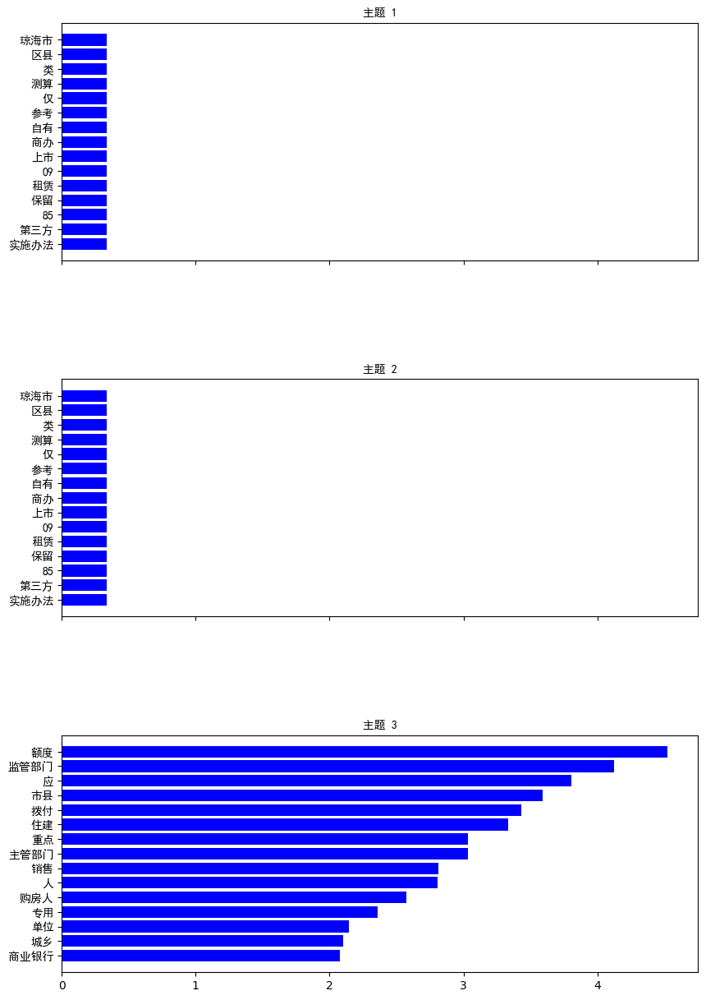

In [11]:
import os
import pandas as pd
# 设置当前工作文件夹
os.chdir(r'C:\...\code')
# 读取当前工作文件夹
current_directory = os.getcwd()
print("当前工作文件夹：", current_directory)


import matplotlib.pyplot as plt
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import TfidfVectorizer

import platform
from matplotlib.font_manager import FontProperties


# Load your actual data
data = pd.read_excel('Policies_text.xlsx')

# Tokenization function using jieba
import jieba
def tokenize_chinese(text):
    return ' '.join(jieba.cut(text))

# Apply tokenization
data['tokenized_content'] = data['content'].apply(tokenize_chinese)

# Vectorization using TfidfVectorizer for Chinese text
vectorizer_zh = TfidfVectorizer(token_pattern=r"(?u)\b\w+\b", max_df=0.95, min_df=2)
dtm_zh = vectorizer_zh.fit_transform(data['tokenized_content'])

# Topic Modeling with LDA for 3 topics
lda_zh = LatentDirichletAllocation(n_components=3, random_state=42)
lda_zh.fit(dtm_zh)

# Extracting the top words for each topic
def get_top_words(model, feature_names, n_top_words):
    top_words = {}
    for topic_idx, topic in enumerate(model.components_):
        top_words[topic_idx] = [feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]
    return top_words

n_top_words = 15
feature_names_zh = vectorizer_zh.get_feature_names_out()
top_words_zh = get_top_words(lda_zh, feature_names_zh, n_top_words)

# Set font based on the operating system
# 设置字体属性
system = platform.system()
if system == 'Windows':
    font_path = 'C:/Windows/Fonts/simhei.ttf'  # Adjust the path as needed
elif system == 'Darwin':
    font_path = '/Library/Fonts/Arial Unicode.ttf'  # Adjust the path as needed
else:
    font_path = '/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf'  # Adjust the path as needed

# 设置字体属性
font_prop = FontProperties(fname=font_path)

# 可视化每个主题的关键词
fig, axes = plt.subplots(3, 1, figsize=(10, 15), sharex=True)
axes = axes.flatten()
for topic_idx, ax in enumerate(axes):
    top_features_ind = lda_zh.components_[topic_idx].argsort()[:-n_top_words - 1:-1]
    top_features = [feature_names_zh[i] for i in top_features_ind]
    weights = lda_zh.components_[topic_idx][top_features_ind]

    ax.barh(top_features, weights, color='blue')
    ax.set_title(f'主题 {topic_idx + 1}', fontproperties=font_prop)  # 设置标题字体属性
    ax.set_yticklabels(top_features, fontproperties=font_prop)  # 设置 y 轴标签字体属性
    ax.invert_yaxis()

plt.subplots_adjust(hspace=0.5)
plt.show()

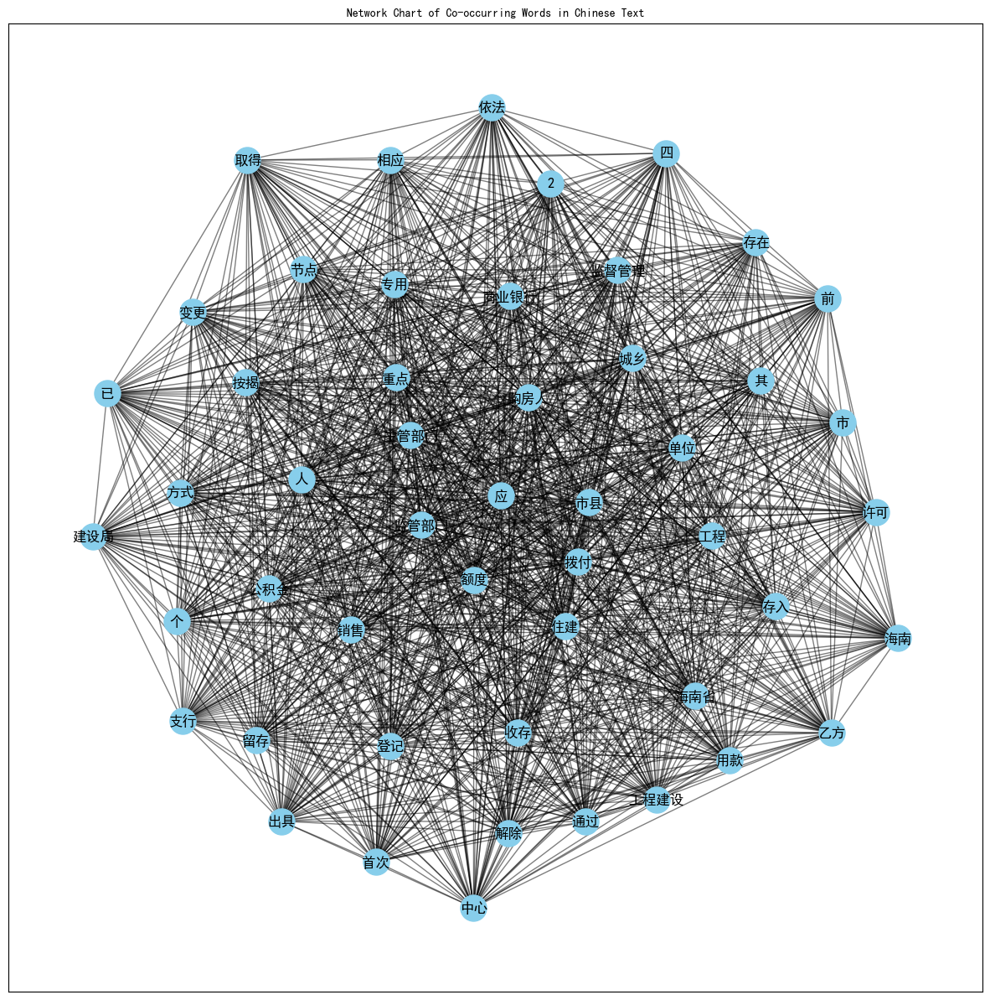

In [13]:

import networkx as nx
import numpy as np
import pandas as pd

# Assuming dtm_zh is your term-document matrix from previous steps

# Compute the co-occurrence matrix
term_document_matrix_zh = dtm_zh.toarray()
co_occurrence_matrix_zh = np.dot(term_document_matrix_zh.T, term_document_matrix_zh)

# Normalize the co-occurrence matrix by setting the diagonal to zero
np.fill_diagonal(co_occurrence_matrix_zh, 0)

# Create a dataframe for the heatmap
co_occurrence_df_zh = pd.DataFrame(co_occurrence_matrix_zh, index=feature_names_zh, columns=feature_names_zh)

# Select a subset for better visualization (top 50 words by occurrence, but here we use the available words)
top_words_indices_zh = np.argsort(np.sum(term_document_matrix_zh, axis=0))[-50:]
top_words_co_occurrence_df_zh = co_occurrence_df_zh.iloc[top_words_indices_zh, top_words_indices_zh]

# Create a graph from the co-occurrence matrix
G = nx.Graph()

# Add nodes and edges
for i in range(len(top_words_indices_zh)):
    for j in range(i + 1, len(top_words_indices_zh)):
        if top_words_co_occurrence_df_zh.iat[i, j] > 0:
            G.add_edge(feature_names_zh[top_words_indices_zh[i]], 
                       feature_names_zh[top_words_indices_zh[j]], 
                       weight=top_words_co_occurrence_df_zh.iat[i, j])

# Draw the network graph
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G, k=0.15)
nx.draw_networkx_nodes(G, pos, node_size=500, node_color='skyblue')
nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=12, font_family=font_prop.get_name())
plt.title("Network Chart of Co-occurring Words in Chinese Text", fontproperties=font_prop)
plt.show()

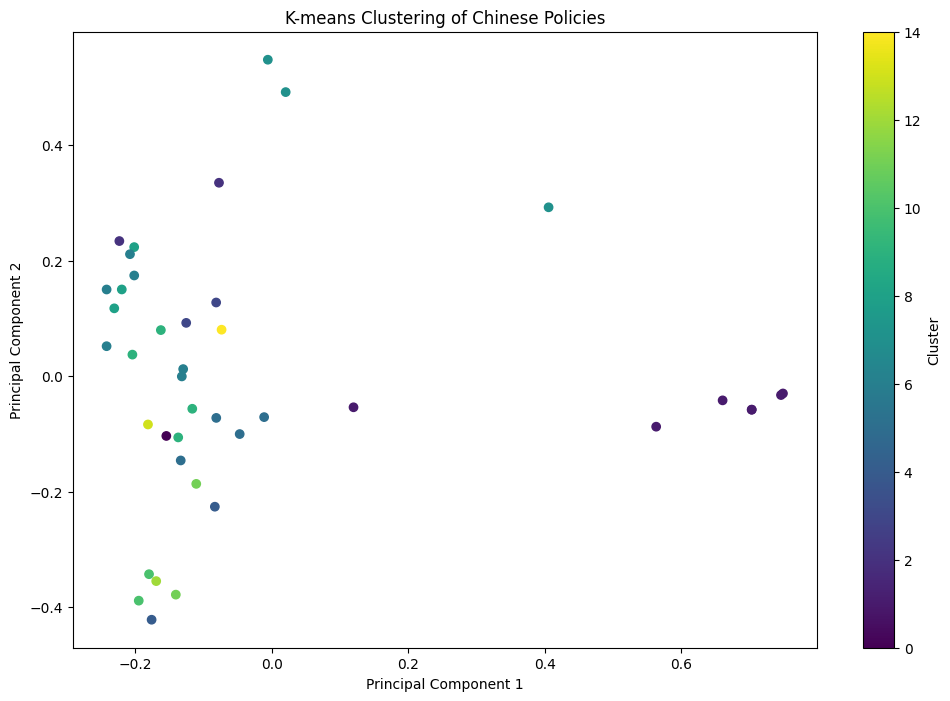

In [4]:

import pandas as pd
import jieba
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA



# Tokenization function using jieba
def tokenize_chinese(text):
    return ' '.join(jieba.cut(text))

# Apply tokenization
data['tokenized_content'] = data['content'].apply(tokenize_chinese)


# Vectorization using TfidfVectorizer for Chinese text
vectorizer_zh = TfidfVectorizer(token_pattern=r"(?u)\b\w+\b", max_df=0.95, min_df=2)
dtm_zh = vectorizer_zh.fit_transform(data['tokenized_content'])


# Apply K-means clustering
num_clusters = 15  # You can adjust this number
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(dtm_zh)
labels = kmeans.labels_


# Use PCA to reduce dimensionality for visualization
pca = PCA(n_components=2)
reduced_features = pca.fit_transform(dtm_zh.toarray())

# Create a scatter plot
plt.figure(figsize=(12, 8))
scatter = plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=labels, cmap='viridis')
plt.title('K-means Clustering of Chinese Policies')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(scatter, label='Cluster')
plt.show()

Silhouette Score: 0.11056583967389712


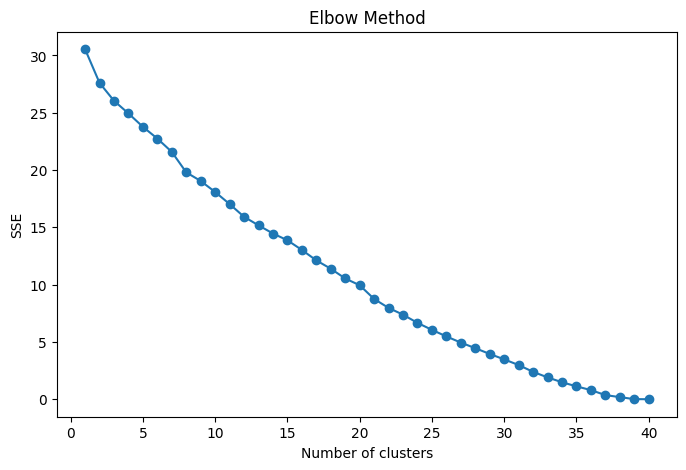

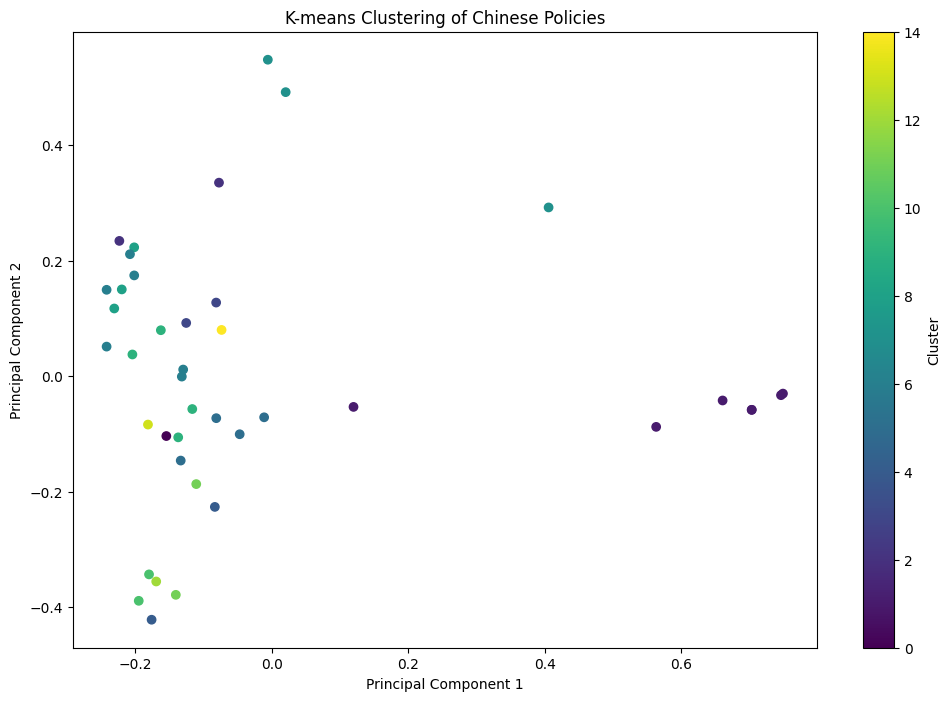

In [5]:
from sklearn.metrics import silhouette_score

# 计算轮廓系数
silhouette_avg = silhouette_score(dtm_zh, labels)
print(f'Silhouette Score: {silhouette_avg}')



import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# 计算不同聚类数的SSE（误差平方和）
sse = []
for k in range(1, 41):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(dtm_zh)
    sse.append(kmeans.inertia_)

# 绘制肘部法图像
plt.figure(figsize=(8, 5))
plt.plot(range(1, 41), sse, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.title('Elbow Method')
plt.show()


import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# 使用PCA降维进行可视化
pca = PCA(n_components=2)
reduced_features = pca.fit_transform(dtm_zh.toarray())

# 创建散点图
plt.figure(figsize=(12, 8))
scatter = plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=labels, cmap='viridis')
plt.title('K-means Clustering of Chinese Policies')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(scatter, label='Cluster')
plt.show()

In [7]:
# Create a DataFrame for better display
top_words_df = pd.DataFrame(top_words_zh).fillna(0)
print(top_words_df)

       0     1     2
0    琼海市   琼海市    额度
1     区县    区县  监管部门
2      类     类     应
3     测算    测算    市县
4      仅     仅    拨付
5     参考    参考    住建
6     自有    自有    重点
7     商办    商办  主管部门
8     上市    上市    销售
9     09    09     人
10    租赁    租赁   购房人
11    保留    保留    专用
12    85    85    单位
13   第三方   第三方    城乡
14  实施办法  实施办法  商业银行


c:\softwares\anaconda3\envs\lym312\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 28023 (\N{CJK UNIFIED IDEOGRAPH-6D77}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
c:\softwares\anaconda3\envs\lym312\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 21335 (\N{CJK UNIFIED IDEOGRAPH-5357}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
c:\softwares\anaconda3\envs\lym312\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 30456 (\N{CJK UNIFIED IDEOGRAPH-76F8}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
c:\softwares\anaconda3\envs\lym312\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 24212 (\N{CJK UNIFIED IDEOGRAPH-5E94}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
c:\softwares\anaconda3\envs\lym312\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 22235 (\N{CJK UNIFIED IDEOGRAPH-56DB}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
c:\softwares\anaconda3\envs\lym312\Lib\site-packages\seaborn\utils.py:

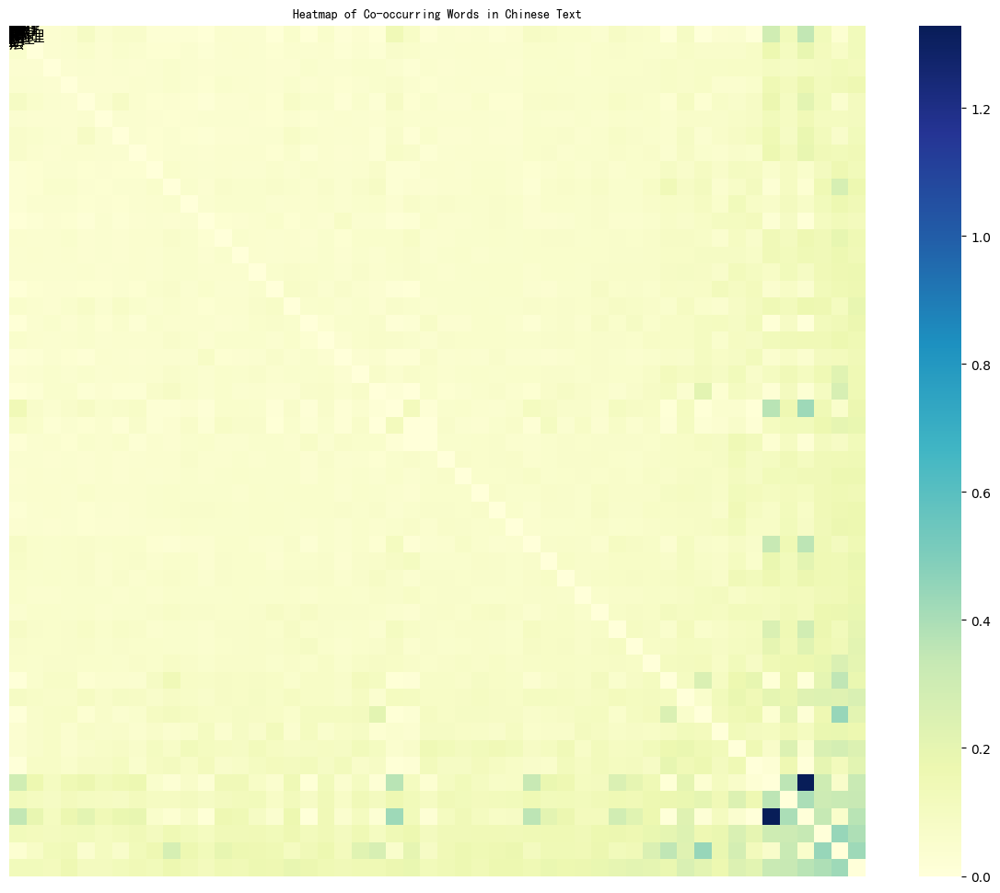

In [15]:

import matplotlib.pyplot as plt
import seaborn as sns

# Create a dataframe for the heatmap
feature_names_zh = vectorizer_zh.get_feature_names_out()
co_occurrence_df_zh = pd.DataFrame(co_occurrence_matrix_zh, index=feature_names_zh, columns=feature_names_zh)

# Select a subset for better visualization (top 50 words by occurrence)
top_words_indices_zh = np.argsort(np.sum(term_document_matrix_zh, axis=0))[-50:]
top_words_co_occurrence_df_zh = co_occurrence_df_zh.iloc[top_words_indices_zh, top_words_indices_zh]

# Plot the heatmap
plt.figure(figsize=(15, 12))
sns.heatmap(top_words_co_occurrence_df_zh, cmap="YlGnBu")
nx.draw_networkx_labels(G, pos, font_size=12, 
                        font_family=font_prop.get_name()
                        )
plt.title("Heatmap of Co-occurring Words in Chinese Text", fontproperties=font_prop)
plt.show()